In [2]:
import random
import pandas as pd
import numpy as np
import os
from tqdm import tqdm
import xgboost as xgb
import matplotlib.pyplot as plt
from sktime.forecasting.model_selection import temporal_train_test_split

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(0) # Seed 고정

def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

def mae(y, pred):
    return np.mean(abs(y-pred))
 #점수 측정을 위한 코드  
def SMAPE(y_true, y_pred):
    return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

def validate(valid_x, valid_y, model):
    pred = model.predict(valid_x)
    smape_score, mae_score = SMAPE(valid_y, pred), mae(valid_y, pred)
    return smape_score, mae_score


#모델 복잡도를 알아보기 위한 함수
def get_model_complexity(model):
    trees = model.get_booster().get_dump()
    depths = [tree.count('\n') for tree in trees]  # 각 트리의 깊이 계산
    avg_depth = sum(depths) / len(depths)
    return avg_depth


전체 칼럼

['temperature', 'rainfall', 'windspeed', 'humidity', 'power_consumption',
       'hour', 'day', 'month', 'week', 'holiday', 'CDH', 'sin_time',
       'cos_time', 'THI', 'outlier', 'day_hour_mean', 'day_hour_std',
       'THI_cat']

In [28]:
i=1
train_df = pd.read_csv(f'./submit/train_building{i}.csv')
train_df.columns

Index(['temperature', 'rainfall', 'windspeed', 'humidity', 'power_consumption',
       'hour', 'day', 'month', 'week', 'holiday', 'CDH', 'sin_time',
       'cos_time', 'THI', 'outlier', 'day_hour_mean', 'day_hour_std',
       'hour_mean', 'hour_std', 'max_power', 'min_power', 'THI_cat'],
      dtype='object')

기본 칼럼만 사용

Index(['temperature', 'power_consumption', 'hour', 'day', 'outlier'], dtype='object')
n_estimator: 100
SMAPE: 7.801347373769672
MAE: 157.49041786389756
깊이의 크기: 87.56


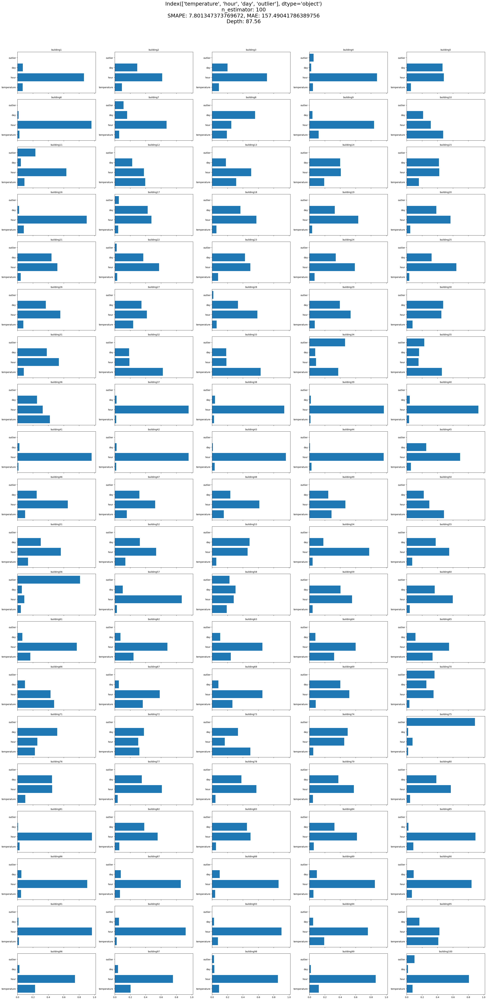

In [3]:
smape_scores = []
mae_scores = []
drop_col = ['rainfall', 'windspeed', 'humidity', 'month', 'week', 'holiday', 'CDH', 'sin_time',
       'cos_time', 'THI', 'day_hour_mean', 'day_hour_std',
       'hour_mean', 'hour_std', 'max_power', 'min_power', 'THI_cat']
i = 1
train_df = pd.read_csv(f'./pretest/train_building{i}.csv').drop(columns=drop_col)
print(train_df.columns)

fig, ax = plt.subplots(20, 5, figsize=(30, 60), sharex=True)
ax = ax.flatten()

for i in range(1,101,1):
    train_df = pd.read_csv(f'./pretest/train_building{i}.csv').drop(columns=drop_col)
    pretest_df = pd.read_csv(f'./pretest/pretest_building{i}.csv').drop(columns=drop_col)
    x_train = train_df.drop(columns=['power_consumption'])
    y_train = train_df['power_consumption']
    y_valid = pretest_df['power_consumption']
    x_valid = pretest_df.drop(columns=['power_consumption'])
    
    #print(f"building_{i}")
    model = xgb.XGBRegressor(seed=0,tree_method="hist",n_estimators =100)
    model.fit(x_train, y_train)
    
    
    complexity = get_model_complexity(model)
    smape_score, mae_score = validate(x_valid, y_valid, model)
    smape_scores.append(smape_score)
    mae_scores.append(mae_score)
    ax[i-1].set_title(f'building{i}',fontsize = 10)
    ax[i-1].barh(x_train.columns, model.feature_importances_)
smape_mean = np.mean(smape_scores)
mae_mean = np.mean(mae_scores)

print(f"n_estimator: 100")
print(f'SMAPE: {smape_mean}\nMAE: {mae_mean}')
print(f"깊이의 크기: {complexity}")

fig.suptitle(f"{x_train.columns}\nn_estimator: 100\nSMAPE: {smape_mean}, MAE: {mae_mean}\nDepth: {complexity}",fontsize=23, y=1.02)
plt.tight_layout()
plt.show()


Index(['temperature', 'rainfall', 'windspeed', 'humidity', 'hour', 'day',
       'month', 'holiday', 'sin_time', 'cos_time', 'outlier', 'THI_cat'],
      dtype='object')
n_estimator: 100
SMAPE: 6.006337542759402
MAE: 115.21477011490643
깊이의 크기: 85.88


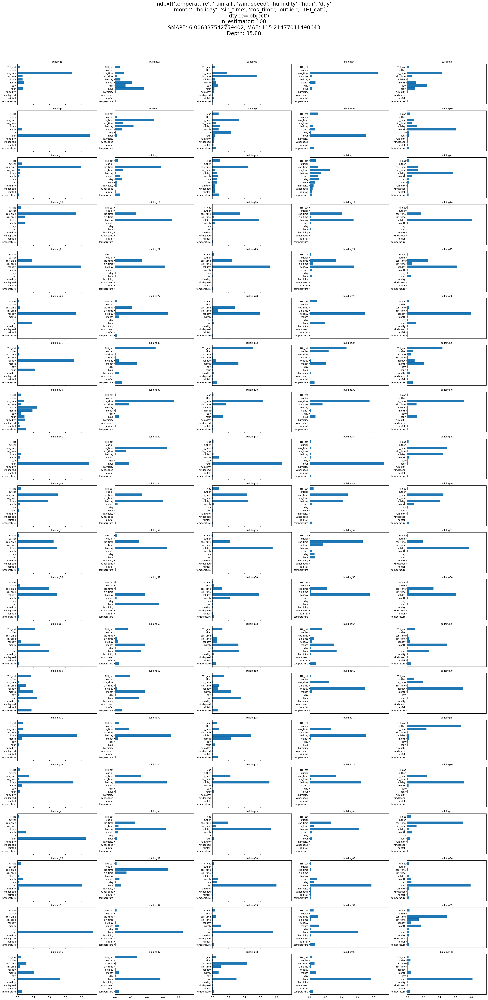

In [4]:
smape_scores = []
mae_scores = []
drop_col = ['week', 'CDH',  'THI', 
       'hour_mean', 'hour_std', 'max_power', 'min_power' ,'day_hour_mean',
       'day_hour_std']

i = 1
train_df = pd.read_csv(f'./pretest/train_building{i}.csv').drop(columns=drop_col)


fig, ax = plt.subplots(20, 5, figsize=(30, 60), sharex=True)
ax = ax.flatten()

for i in range(1,101,1):
    train_df = pd.read_csv(f'./pretest/train_building{i}.csv').drop(columns=drop_col)
    pretest_df = pd.read_csv(f'./pretest/pretest_building{i}.csv').drop(columns=drop_col)
    x_train = train_df.drop(columns=['power_consumption'])
    y_train = train_df['power_consumption']
    y_valid = pretest_df['power_consumption']
    x_valid = pretest_df.drop(columns=['power_consumption'])
    
    #print(f"building_{i}")
    model = xgb.XGBRegressor(seed=0,tree_method="hist",n_estimators =100)
    model.fit(x_train, y_train)
    
    
    complexity = get_model_complexity(model)
    smape_score, mae_score = validate(x_valid, y_valid, model)
    smape_scores.append(smape_score)
    mae_scores.append(mae_score)
    ax[i-1].set_title(f'building{i}',fontsize = 10)
    ax[i-1].barh(x_train.columns, model.feature_importances_)
smape_mean = np.mean(smape_scores)
mae_mean = np.mean(mae_scores)
print(x_train.columns)
print(f"n_estimator: 100")
print(f'SMAPE: {smape_mean}\nMAE: {mae_mean}')
print(f"깊이의 크기: {complexity}")

fig.suptitle(f"{x_train.columns}\nn_estimator: 100\nSMAPE: {smape_mean}, MAE: {mae_mean}\nDepth: {complexity}", fontsize=23, y=1.02)
plt.tight_layout()
plt.show()

In [15]:
for n_estimator in [100]:
    smape_scores = []
    mae_scores = []
    drop_col = ['week', 'CDH',  'THI', 'hour_mean', 'hour_std', 'max_power', 'min_power' ,'day_hour_mean','day_hour_std']
    for i in range(1,101,1):
        train_df = pd.read_csv(f'./pretest/train_building{i}.csv').drop(columns=drop_col)
        pretest_df = pd.read_csv(f'./pretest/pretest_building{i}.csv').drop(columns=drop_col)
        x_train = train_df.drop(columns=['power_consumption'])
        y_train = train_df['power_consumption']
        y_valid = pretest_df['power_consumption']
        x_valid = pretest_df.drop(columns=['power_consumption'])
        
        #print(f"building_{i}")
        model = xgb.XGBRegressor(seed=0,tree_method="hist",n_estimators =100)
        model.fit(x_train, y_train)
        smape_score, mae_score = validate(x_valid, y_valid, model)
        smape_scores.append(smape_score)
        mae_scores.append(mae_score)
    smape_mean = np.mean(smape_scores)
    mae_mean = np.mean(mae_scores)
        
    print(f"n_estimator: 100")
    print(f'SMAPE: {smape_mean}\nMAE: {mae_mean}')
    print()

n_estimator: 100
SMAPE: 7.212209406996305
MAE: 143.62088848658198


  0%|          | 0/100 [00:00<?, ?it/s]

[20:56:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

  1%|          | 1/100 [00:00<01:21,  1.21it/s]

[20:56:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

  2%|▏         | 2/100 [00:01<01:15,  1.30it/s]

[20:56:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

  3%|▎         | 3/100 [00:02<01:12,  1.35it/s]

[20:56:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

  4%|▍         | 4/100 [00:02<01:10,  1.35it/s]

[20:56:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

  5%|▌         | 5/100 [00:03<01:16,  1.25it/s]

[20:56:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

  6%|▌         | 6/100 [00:04<01:14,  1.26it/s]

[20:56:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

  7%|▋         | 7/100 [00:05<01:18,  1.18it/s]

[20:56:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

  8%|▊         | 8/100 [00:06<01:19,  1.16it/s]

[20:56:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

  9%|▉         | 9/100 [00:07<01:20,  1.13it/s]

[20:56:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 10%|█         | 10/100 [00:08<01:25,  1.06it/s]

[20:56:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 11%|█         | 11/100 [00:09<01:19,  1.11it/s]

[20:56:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 12%|█▏        | 12/100 [00:10<01:15,  1.16it/s]

[20:56:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 13%|█▎        | 13/100 [00:10<01:13,  1.18it/s]

[20:56:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 14%|█▍        | 14/100 [00:11<01:11,  1.20it/s]

[20:56:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 15%|█▌        | 15/100 [00:12<01:09,  1.22it/s]

[20:56:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 16%|█▌        | 16/100 [00:13<01:09,  1.21it/s]

[20:56:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 17%|█▋        | 17/100 [00:14<01:08,  1.21it/s]

[20:56:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 18%|█▊        | 18/100 [00:15<01:07,  1.21it/s]

[20:56:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 19%|█▉        | 19/100 [00:15<01:05,  1.23it/s]

[20:56:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 20%|██        | 20/100 [00:16<01:04,  1.24it/s]

[20:56:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 21%|██        | 21/100 [00:17<01:03,  1.25it/s]

[20:56:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 22%|██▏       | 22/100 [00:18<01:02,  1.24it/s]

[20:56:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 23%|██▎       | 23/100 [00:18<01:01,  1.25it/s]

[20:56:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 24%|██▍       | 24/100 [00:19<01:00,  1.25it/s]

[20:56:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 25%|██▌       | 25/100 [00:20<01:00,  1.25it/s]

[20:56:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 26%|██▌       | 26/100 [00:21<00:59,  1.25it/s]

[20:56:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 27%|██▋       | 27/100 [00:22<00:59,  1.24it/s]

[20:56:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 28%|██▊       | 28/100 [00:23<00:57,  1.25it/s]

[20:56:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 29%|██▉       | 29/100 [00:23<00:57,  1.24it/s]

[20:56:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 30%|███       | 30/100 [00:24<00:57,  1.21it/s]

[20:56:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 31%|███       | 31/100 [00:25<00:56,  1.22it/s]

[20:56:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 32%|███▏      | 32/100 [00:26<00:55,  1.23it/s]

[20:56:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 33%|███▎      | 33/100 [00:27<00:54,  1.24it/s]

[20:56:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 34%|███▍      | 34/100 [00:27<00:52,  1.25it/s]

[20:56:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 35%|███▌      | 35/100 [00:28<00:51,  1.27it/s]

[20:56:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 36%|███▌      | 36/100 [00:29<00:50,  1.27it/s]

[20:56:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 37%|███▋      | 37/100 [00:30<00:52,  1.19it/s]

[20:56:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 38%|███▊      | 38/100 [00:31<00:52,  1.19it/s]

[20:56:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 39%|███▉      | 39/100 [00:32<00:50,  1.20it/s]

[20:56:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 40%|████      | 40/100 [00:32<00:49,  1.21it/s]

[20:56:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 41%|████      | 41/100 [00:33<00:48,  1.21it/s]

[20:56:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 42%|████▏     | 42/100 [00:34<00:47,  1.22it/s]

[20:56:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 43%|████▎     | 43/100 [00:35<00:46,  1.21it/s]

[20:56:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 44%|████▍     | 44/100 [00:36<00:46,  1.22it/s]

[20:56:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 45%|████▌     | 45/100 [00:36<00:45,  1.20it/s]

[20:56:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 46%|████▌     | 46/100 [00:37<00:45,  1.19it/s]

[20:56:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 47%|████▋     | 47/100 [00:38<00:45,  1.17it/s]

[20:56:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 48%|████▊     | 48/100 [00:39<00:44,  1.17it/s]

[20:56:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 49%|████▉     | 49/100 [00:40<00:42,  1.19it/s]

[20:56:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 50%|█████     | 50/100 [00:41<00:41,  1.21it/s]

[20:56:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 51%|█████     | 51/100 [00:42<00:40,  1.21it/s]

[20:56:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 52%|█████▏    | 52/100 [00:42<00:39,  1.20it/s]

[20:56:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 53%|█████▎    | 53/100 [00:43<00:40,  1.17it/s]

[20:56:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 54%|█████▍    | 54/100 [00:44<00:39,  1.17it/s]

[20:56:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 55%|█████▌    | 55/100 [00:45<00:38,  1.18it/s]

[20:56:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 56%|█████▌    | 56/100 [00:46<00:37,  1.18it/s]

[20:56:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 57%|█████▋    | 57/100 [00:47<00:36,  1.19it/s]

[20:56:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 58%|█████▊    | 58/100 [00:47<00:34,  1.20it/s]

[20:56:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 59%|█████▉    | 59/100 [00:48<00:34,  1.20it/s]

[20:56:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 60%|██████    | 60/100 [00:49<00:33,  1.18it/s]

[20:56:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 61%|██████    | 61/100 [00:50<00:32,  1.18it/s]

[20:56:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 62%|██████▏   | 62/100 [00:51<00:32,  1.19it/s]

[20:56:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 63%|██████▎   | 63/100 [00:52<00:31,  1.17it/s]

[20:56:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 64%|██████▍   | 64/100 [00:53<00:30,  1.17it/s]

[20:56:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:56:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 65%|██████▌   | 65/100 [00:53<00:29,  1.18it/s]

[20:57:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 66%|██████▌   | 66/100 [00:54<00:28,  1.18it/s]

[20:57:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 67%|██████▋   | 67/100 [00:55<00:28,  1.16it/s]

[20:57:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 68%|██████▊   | 68/100 [00:56<00:27,  1.17it/s]

[20:57:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 69%|██████▉   | 69/100 [00:57<00:26,  1.19it/s]

[20:57:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 70%|███████   | 70/100 [00:58<00:26,  1.14it/s]

[20:57:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 71%|███████   | 71/100 [00:59<00:25,  1.15it/s]

[20:57:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 72%|███████▏  | 72/100 [00:59<00:24,  1.16it/s]

[20:57:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 73%|███████▎  | 73/100 [01:00<00:23,  1.16it/s]

[20:57:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 74%|███████▍  | 74/100 [01:01<00:22,  1.14it/s]

[20:57:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 75%|███████▌  | 75/100 [01:02<00:21,  1.15it/s]

[20:57:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 76%|███████▌  | 76/100 [01:03<00:21,  1.12it/s]

[20:57:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 77%|███████▋  | 77/100 [01:04<00:21,  1.09it/s]

[20:57:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 78%|███████▊  | 78/100 [01:05<00:20,  1.06it/s]

[20:57:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:12] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 79%|███████▉  | 79/100 [01:06<00:20,  1.05it/s]

[20:57:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 80%|████████  | 80/100 [01:07<00:18,  1.07it/s]

[20:57:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 81%|████████  | 81/100 [01:08<00:17,  1.08it/s]

[20:57:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 82%|████████▏ | 82/100 [01:09<00:16,  1.09it/s]

[20:57:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 83%|████████▎ | 83/100 [01:10<00:15,  1.10it/s]

[20:57:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 84%|████████▍ | 84/100 [01:10<00:14,  1.10it/s]

[20:57:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 85%|████████▌ | 85/100 [01:11<00:13,  1.11it/s]

[20:57:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 86%|████████▌ | 86/100 [01:12<00:12,  1.12it/s]

[20:57:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 87%|████████▋ | 87/100 [01:13<00:11,  1.11it/s]

[20:57:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 88%|████████▊ | 88/100 [01:14<00:10,  1.12it/s]

[20:57:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 89%|████████▉ | 89/100 [01:15<00:09,  1.13it/s]

[20:57:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 90%|█████████ | 90/100 [01:16<00:08,  1.14it/s]

[20:57:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 91%|█████████ | 91/100 [01:17<00:07,  1.15it/s]

[20:57:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 92%|█████████▏| 92/100 [01:17<00:06,  1.16it/s]

[20:57:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 93%|█████████▎| 93/100 [01:18<00:06,  1.15it/s]

[20:57:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 94%|█████████▍| 94/100 [01:19<00:05,  1.13it/s]

[20:57:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 95%|█████████▌| 95/100 [01:20<00:04,  1.13it/s]

[20:57:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 96%|█████████▌| 96/100 [01:21<00:03,  1.14it/s]

[20:57:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 97%|█████████▋| 97/100 [01:22<00:02,  1.14it/s]

[20:57:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 98%|█████████▊| 98/100 [01:23<00:01,  1.14it/s]

[20:57:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

 99%|█████████▉| 99/100 [01:24<00:00,  1.13it/s]

[20:57:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1
[20:57:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting 

100%|██████████| 100/100 [01:25<00:00,  1.18it/s]

[20:57:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:339: No visible GPU is found, setting `gpu_id` to -1


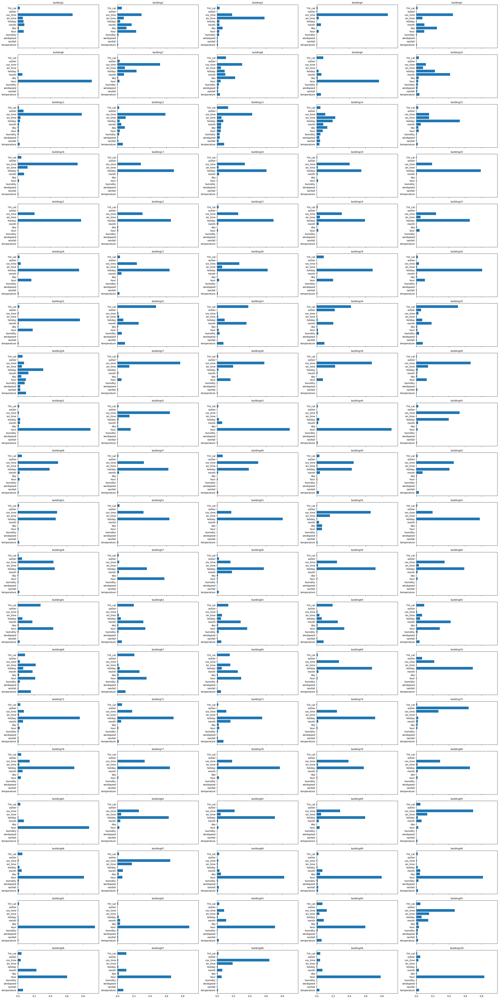

In [5]:
preds = np.array([])
fig, ax = plt.subplots(20, 5, figsize=(30, 60), sharex=True)
ax = ax.flatten()
drop_col = ['week', 'CDH',  'THI', 'hour_mean', 'hour_std', 'max_power', 'min_power' ,'day_hour_mean','day_hour_std']
for i in tqdm(range(1,101,1)):
    feature_importances = []
    train_df = pd.read_csv(f'./submit/train_building{i}.csv').drop(columns=drop_col)
    test_df = pd.read_csv(f'./submit/test_building{i}.csv').drop(columns=drop_col)
    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame
    
    t_x = train_df.drop(columns=['power_consumption'])
    t_y = train_df['power_consumption']
 
    #print(f"building_{i}")
    for seed in [0,1,2,3,4,5,6]:
        
        model = xgb.XGBRegressor(seed=0,tree_method="hist",
                                 n_estimators = 100)
        model.fit(t_x, t_y)
        y_pred = model.predict(test_df)
        feature_importances.append(model.feature_importances_)
        pred_df.loc[:,seed] = y_pred  
    pred = pred_df.mean(axis=1)
    preds = np.append(preds, pred)
    average_feature_importances = np.mean(feature_importances, axis=0)
    ax[i-1].set_title(f'building{i}',fontsize = 10)
    ax[i-1].barh(t_x.columns, average_feature_importances)
    
    

plt.tight_layout()
plt.show()
    


In [6]:
########################################
csv_name = './submission/XGBoost_wsw_simple.csv'
########################################
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv(f'{csv_name}', index = False)

In [21]:
i=2
train_df = pd.read_csv(f'./submit/train_building{i}.csv')
train_df = train_df.groupby(['week', 'hour'])['power_consumption'].mean().reset_index().pivot(index='week', columns='hour', values='power_consumption')

In [7]:
fig, ax = plt.subplots(50,2,figsize=(40, 160), sharex=True)
ax = ax.flatten() 
xticks = np.arange(0, 169, 24) 
xtick_labels = ['0', '24', '48', '72', '96', '120', '144', '168']
for i in range(1,101,1):
    # 그래프 제목 추가
    ax[i-1].set_title(f"building_{i}")
    #day_hour_mean생성
    train_df = pd.read_csv(f'./submit/train_building{i}.csv')
        # 새로운 행 순서를 지정한 리스트 생성
    train_df = train_df.groupby(['day', 'hour'])['power_consumption'].mean().reset_index().pivot(index='day', columns='hour', values='power_consumption')
    # iloc를 사용하여 행 순서 변경
    new_order = [3,4,5,6,0,1,2]
    train_df = train_df.iloc[new_order]
    day_hour_mean = train_df.values.flatten()
    #데이-아워-민
    ax[i-1].plot(np.arange(168),day_hour_mean,label = 'day_hour_mean',color='red')	
    
    xgboost_simple = pd.read_csv('./submission/XGBoost_wsw_simple.csv')
    xgboost_simple = xgboost_simple.loc[xgboost_simple.index[168*(i-1):168*(i)], 'answer']
    ax[i-1].plot(np.arange(168),xgboost_simple,label = 'xgboost_simple')
    
    #x축, 범례 설정
    ax[i-1].set_xticks(xticks)
    ax[i-1].set_xticklabels(xtick_labels)
    ax[i-1].legend()
plt.tight_layout()
plt.show()